In [1]:
import numpy as np

import matplotlib.pyplot as plt
from scipy.integrate import odeint
import mpmath as mpmath

# %matplotlib notebook 
%matplotlib inline 

import importlib  # for reloading routines if you need to edit them

In [2]:
notebookroot = 'SS'  

# routines for classical system integration 

# set up equations of motion
# y = [phi,p]  dimension 2
# H(phi,p,tau) = a(1 - cos (p-b)) - epsilon*cos phi - mu*cos(phi - tau) - mup*cos(phi + tau)
# dy/dt = [\dot phi, \dot p]
#       = [a\sin p, -epsilon*sin(phi) - mu*sin(phi - tau) - mup*sin(phi + tau) ]
#There should be three islands, one at p=0 and the others at sin p=1/a
#the widths of these are set by \sqrt{2 epsilon/a}, \sqrt{2 mu/a},  \sqrt{2 mup/a}

# dy/dtau = func(y,tau), needed for integrator!
# note that y[0] = phi and y[1] = p
def cfunc(y,tau,a,b,epsilon,mu,mup):
        return [a*np.sin(y[1]-b),\
                -epsilon*np.sin(y[0]) - mu*np.sin(y[0] - tau) - mup*np.sin(y[0] + tau)]

# is used for energy values, not currently used anywhere
def H_classical(p,phi,tau,a,b,epsilon,mu,mup):
    #phi = y[0]; p = y[1]
    return a*(1.0 - np.cos(p-b)) - epsilon*np.cos(phi)\
        - mu*np.cos(phi-tau) - mup*np.cos(phi+tau)

# we use this function to compute expectation values and dispersions of unperturbed energies, for classical orbits
def H_classical0(p,phi,tau,a,b,epsilon,mu,mup):
    return a*(1.0 - np.cos(p-b)) - epsilon*np.cos(phi) 
        #- mu*np.cos(phi-tau) - mup*np.cos(phi+tau)

In [3]:
# integrate at a period, the forced pendulum 
# arguments:
#   y0: is initial conditions, 
#   npoints: is number of points we want
#   a,epsilon, mu, mup: are parameters of the Hamiltonian model
#   taushift:  points of output are at times  taushift + 2 pi n, integer n up to npoints 
#
#   integrate every 2 pi period, npoints returned including initial condition 
# returns: phi,p arrays of integrated points 
# this particular routine does all times at once by sending a set of times to the integrator
# if we want to take p modulo 2pi we would have to integrate slowly to find when trajectories
# cross pi or -pi
twopi = 2.0*np.pi
def givepoints_arr(y0,npoints,a,b,epsilon,mu,mup,taushift):
    # set up time array, every 2pi/nu so for period of perturbation
    step  = 2.0*np.pi
    stop = step*npoints
    time  = np.arange(0.0,stop,step)  # time array for outputs  goes from 0 to stop-step 
    #                              with increment step, does not reach stop. 
    time += taushift  # shift time vector 
    # do the integration
    y = odeint(cfunc, y0, time, args=(a,b,epsilon,mu,mup))
    #y2 = odeint(func, y0, time, Dfun=jacobian, args=(epsilon,mu,nu))  # if you want to use a jacobian
    phi_arr = np.squeeze(y[:,0])  # is an array of phi at different times
    p_arr = np.squeeze(y[:,1])    # is an array of momenta at different times
    
    phi_arr  = phi_arr%twopi  # so that phi in [0:2pi]
    p_arr = p_arr%twopi  # so that p is in [0,2pi]
    
    ii = phi_arr >np.pi
    phi_arr[ii]-= twopi # now phi is in [-pi,pi]
    ii = p_arr >np.pi
    p_arr[ii]-= twopi   # now p is in [-pi,pi]
    
    return phi_arr,p_arr 
       
# integrate points and plot them on axis ax   
def givepoints(y0,npoints,a,b,epsilon,mu,mup,taushift,marker,ax):
    phi_arr,p_arr=givepoints_arr(y0,npoints,a,b,epsilon,mu,mup,taushift)
    ax.plot(phi_arr,p_arr,marker,markersize=0.5) # plot it
    
colorlist = ['black','blue','green','magenta','red','orange','gold','blueviolet','springgreen','dodgerblue']

# randomly choose an initial condition, integrate and plot in axis ax 
# arguments:
#    npoints: numbers of points to plot 
#    pmin, pmax constrain the vertical width of randomly chosen initial conditions 
#    a,epsilon,mu,mup,b: parameters for the dynamical model 
#    ax  the axis on which to plot points 
def rand_give_points(npoints,a,b,epsilon,mu,mup,taushift,pmin,pmax,ax):
    phi = np.random.uniform(low=-np.pi,high=np.pi)
    p = np.random.uniform(low=pmin,high=pmax)
    y0 = [phi,p]
    phi_arr,p_arr=givepoints_arr(y0,npoints,a,b,epsilon,mu,mup,taushift)
    i = np.random.randint(low=0,high =len(colorlist))
    ax.scatter(phi_arr,p_arr,s=1,edgecolor='none',facecolor=colorlist[i],lw=1)

# make a surface of section figure with orbits 
# inputs: a classical model class, and a label
def mkfig_cl(cla,alabel):
    norb = cla.norb
    npoints = cla.npoints
    a = cla.a 
    b = cla.b 
    eps = cla.eps
    mu = cla.mu
    mup = cla.mup 
    taushift = cla.taushift
    froot = cla.froot
    
    # set up display
    fig,ax = plt.subplots(1,1,figsize=(3,3),dpi=200) 
    plt.subplots_adjust(bottom=0.18,top=0.90,left=0.18,right=0.98)
    ax.text(2.6,-3.9,r'$\phi$',fontsize=14)
    ax.set_ylabel('p',labelpad=0)
    ax.set_aspect('equal')

    fac=1.01
    xmax = np.pi;  ymax = np.pi;  ymin = -ymax
    ax.set_xlim([-xmax*fac,xmax*fac])
    ax.set_ylim([ ymin*fac,ymax*fac])

    parm_label = r'$a$={:.2f},'.format(a)
    parm_label += r'$\epsilon$={:.2f},'.format(eps)
    parm_label += r'$\mu$={:.2f},'.format(mu)
    muprime = r'$\mu$' + '\''
    parm_label += muprime
    parm_label += r'={:.2f}'.format(mup)
    #parm_label += r'$\nu$={:.0f}'.format(nu)
    ax.text(0,3.4,parm_label,ha='center',va='center')

    for i in range(norb):  # this many orbits , and plots points
        rand_give_points(npoints,a,b,eps,mu,mup,taushift,ymin,ymax,ax)
        
    if (len(alabel)>1):
        plt.text(-4.5,3.2,alabel,fontsize=14)
    if (len(froot)>2):
        ofile = froot + '_class.png'
        print(ofile)
        plt.savefig(ofile,dpi=300)
        
    plt.show()
     
# a class to store classical model info
#    norb:  numbers of orbits
#    npoints: numbers of points to plot 
#    a,epsilon,mu,mup,b,taushift: parameters for the dynamical model 
#    froot: a root for labeling files 
class Hcla:
    def __init__(self,norb,npoints,a,b,eps,mu,mup,taushift,froot):
        self.a = a
        self.b = b
        self.eps = eps
        self.mu = mu
        self.mup = mup
        self.taushift = taushift
        self.norb = norb
        self.npoints = npoints
        self.froot = froot
        
    # randomly choose an norb initial conditions, integrate and compute <h_0> and sqrt(<h_0^2 - <h_0>^2>)
    #  from the orbits  
    # compute   mu_arr: mean H0 of each orbit
    # compute   sig_arr: standard deviation of H0 for each orbit
    # store this info in the class itself
    def sigh0_orbs(self):
        mu_arr = np.zeros(self.norb)
        sig_arr = np.zeros(self.norb)
        for i in range(self.norb):
            phi = np.random.uniform(low=-np.pi,high=np.pi)
            p = np.random.uniform(low=-np.pi,high=np.pi)
            y0 = [phi,p]
            phi_arr,p_arr=givepoints_arr(y0,self.npoints,self.a,self.b,self.eps,self.mu,self.mup,self.taushift)
            # Elist = H_classical(p_arr,phi_arr,1,self.a,self.b,self.eps,self.mu,self.mup)  #this is wrong 
            # why is there a tau=1 here and why is not mu=0,mup=0 so it is actually h0?
            Elist = H_classical0(p_arr,phi_arr,0,self.a,self.b,self.eps,self.mu,self.mup) # this is correct and what we should use
            # gives values of <H0> and sigma^2 for H0 for classical orbits!  (fixed Feb 2025, but did not affect figures significantly)
            # if <h0> classical look bad, do more orbits or redo to get different random initial conditions for the orbits 
            mu_arr[i] = np.mean(Elist)  # compute means of H0
            sig_arr[i] = np.std(Elist)  # compute standard deviations of H0
            
        iphi = np.argsort(mu_arr) # in order of increasing energy
        self.mu_arr = mu_arr[iphi]
        self.sig_arr = sig_arr[iphi]
        #return mu_arr,sig_arr
    
    def print_info(self):
        # compute resonance half widths 
        wid0 = 2*np.arcsin(np.sqrt(np.abs(self.eps/self.a)))
        widmu = 2*np.arcsin(np.sqrt(np.abs(self.mu/self.a)))
        widmup = 2*np.arcsin(np.sqrt(np.abs(self.mup/self.a)))
        print('res widths {:.2f}, {:.2f}, {:.2f}'.format(wid0,widmu,widmup))
    
        if (self.a<1):
            print('res locs p=0,+-none, a <1')
        else:
            p_mu = np.arcsin(1/self.a)  # a resonance location 
            print('res locs p=0,+-{:.2f}'.format(p_mu))
            overlap1 = p_mu - (wid0+widmu)
            overlap2 = p_mu - (wid0+widmup)
            print('overlaps {:.2f} {:.2f}'.format(overlap1,overlap2)) # guess of overlaps
        
        omega0 = np.sqrt(self.a*self.eps) # frequency of primary resonance 
        print('omega0 = {:.2f}'.format(omega0))
        
        # not sure what this is right now
        deltH = 4*np.pi*self.mu/omega0  * np.exp(-0.5*np.pi/omega0)  # this is the half width about 
        print('deltH = {:.3f}'.format(deltH))
        #range of energy is 2*(eps+a), range of p is 2pi so we guess at 
        Deltp = 2*deltH/(2*self.eps + 2*self.a) *2*np.pi # change in p is
        print('Deltp = {:.3f}'.format(Deltp))

In [4]:
# inputs: a classical model class, and a label
# put three surfaces of section together 
def mkfig_cl3(cla,alabel,mufacs):
    norb = cla.norb
    npoints = cla.npoints
    a = cla.a 
    b = cla.b 
    eps = cla.eps
    mu = cla.mu
    mup = cla.mup 
    taushift = cla.taushift
    froot = cla.froot

    nmu = len(mufacs)
    
    # set up display
    fig,axarr = plt.subplots(1,nmu,figsize=(6,2.4),dpi=300) 
    plt.subplots_adjust(bottom=0.18,top=0.90,left=0.12,right=0.98,hspace=0,wspace=0)
    axarr[0].text(3.0,-3.9,r'$\phi$',fontsize=14)
    axarr[0].set_ylabel('p',labelpad=0)
    for i in range(nmu):
        axarr[i].set_aspect('equal')
        fac=1.01
        xmax = np.pi;  ymax = np.pi;  ymin = -ymax
        axarr[i].set_xlim([-xmax*fac,xmax*fac])
        axarr[i].set_ylim([ ymin*fac,ymax*fac])

    for i in range(1,nmu):
        axarr[i].set_xticks([])
        axarr[i].set_yticks([])

    parm_label = r'$a$={:.2f},'.format(a)
    parm_label += r'$\epsilon$={:.2f},'.format(eps)
    parm_label += r'$b$={:.1f}'.format(b)
    #parm_label += r'$\mu$={:.2f},'.format(mu)
    muprime = r'$\mu$' + '\''
    #parm_label += muprime
    #parm_label += r'={:.2f}'.format(mup)
    #parm_label += r'$\nu$={:.0f}'.format(nu)
    axarr[nmu-1].text(3.0,-3.53,parm_label,ha='right',va='center')

    zlabel = mlabel = r'$\mu$=' + muprime + '='
    for k in range(nmu):
        print(mu*mufacs[k],mup*mufacs[k])
        for i in range(norb):  # this many orbits , and plots points
            rand_give_points(npoints,a,b,eps,mu*mufacs[k],mup*mufacs[k],taushift,ymin,ymax,axarr[k])
        if (k==0):
            mlabel = zlabel
        else:
            mlabel = ""
        mlabel += r'{:.2f}'.format(mufacs[k])  + r'$\epsilon$' 
        axarr[k].text(0,3.4,mlabel,ha='center',va='center')
        
    if (len(alabel)>1):
        axarr[0].text(-4.1,3.2,alabel,fontsize=14,ha='center')
        
    if (len(froot)>2):
        ofile = froot + '_class3.png'
        print(ofile)
        plt.savefig(ofile,dpi=300)
        
    plt.show()

0.125 0.125
0.25 0.25
0.5 0.5
SS_S1_class3.png


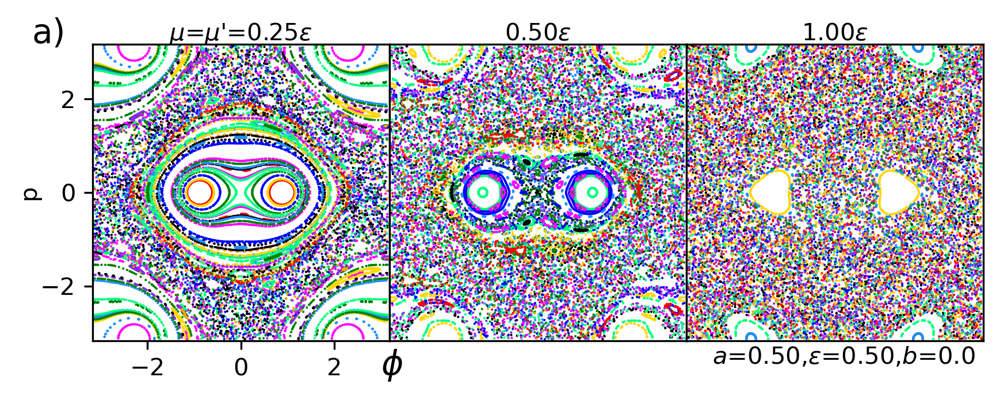

In [97]:
# choose parameters
b=0.; taushift = 0.
a=0.5;   eps=a
mu=eps; mup=mu
npoints=200 # points in each orbit!
norb = 100  # number of orbits
froot = notebookroot+'_S1'
cla_S1 = Hcla(norb,npoints,a,b,eps,mu,mup,taushift,froot)
mufacs = np.array([0.25,0.5,1.0])
alabel = "a)"
mkfig_cl3(cla_S1,alabel,mufacs)



0.75 0.75
1.5 1.5
3.0 3.0


/var/folders/l_/tk7gphlj0d38754sb6x8p1f00000gn/T/ipykernel_70962/1546291466.py:22: ODEintWarning: Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.
  y = odeint(cfunc, y0, time, args=(a,b,epsilon,mu,mup))


SS_S2_class3.png


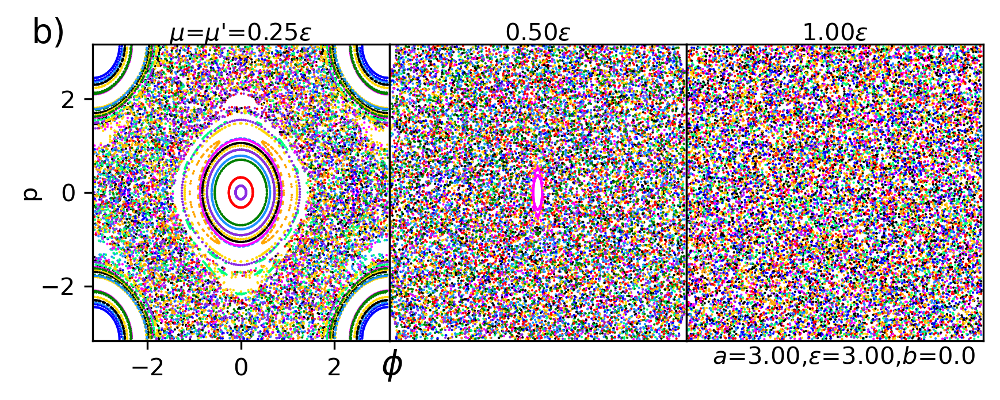

In [98]:
# choose parameters
b=0.; taushift = 0.
a=3.0;   eps=a
mu=eps; mup=mu
npoints=200 # points in each orbit!
norb = 100  # number of orbits
froot = notebookroot+'_S2'
cla_S2 = Hcla(norb,npoints,a,b,eps,mu,mup,taushift,froot)
mufacs = np.array([0.25,0.5,1.0])
alabel = "b)"
mkfig_cl3(cla_S2,alabel,mufacs)


SS_S1a_class.png


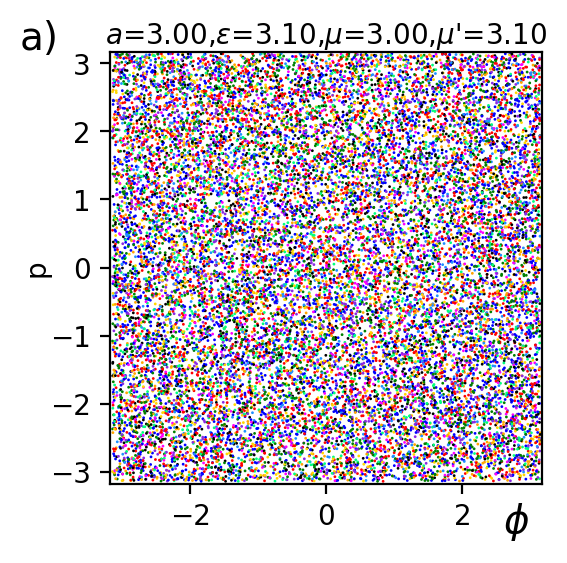

res widths nan, 3.14, nan
res locs p=0,+-0.34
overlaps nan nan
omega0 = 3.05
deltH = 7.386
Deltp = 7.607


/var/folders/l_/tk7gphlj0d38754sb6x8p1f00000gn/T/ipykernel_12288/1546291466.py:149: RuntimeWarning: invalid value encountered in arcsin
  wid0 = 2*np.arcsin(np.sqrt(np.abs(self.eps/self.a)))
/var/folders/l_/tk7gphlj0d38754sb6x8p1f00000gn/T/ipykernel_12288/1546291466.py:151: RuntimeWarning: invalid value encountered in arcsin
  widmup = 2*np.arcsin(np.sqrt(np.abs(self.mup/self.a)))


In [7]:
# choose parameters
b=0.2; taushift = 0 
a=3.0;   eps=3.1
mu=3.0; mup=3.1
npoints=200 # points in each orbit!
norb = 100  # sumber of orbits
froot = notebookroot+'_S1a'
cla_S1a = Hcla(norb,npoints,a,b,eps,mu,mup,taushift,froot)

mkfig_cl(cla_S1a,'a)')
cla_S1a.print_info()
#cla_S1c.sigh0_orbs()

SS_S1b_class.png


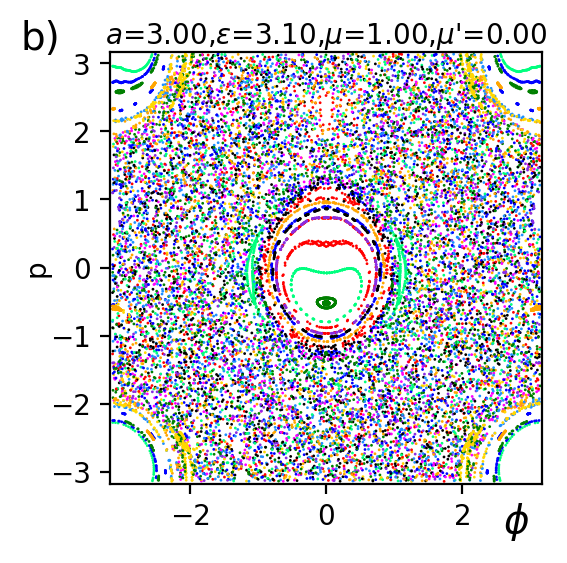

res widths nan, 1.23, 0.00
res locs p=0,+-0.34
overlaps nan nan
omega0 = 3.05
deltH = 2.462
Deltp = 2.536


/var/folders/l_/tk7gphlj0d38754sb6x8p1f00000gn/T/ipykernel_12288/1546291466.py:149: RuntimeWarning: invalid value encountered in arcsin
  wid0 = 2*np.arcsin(np.sqrt(np.abs(self.eps/self.a)))


In [8]:
# choose parameters
b=0.0; taushift = 0 
a=3.0;   eps=3.1
mu=1.0; mup=0.0
npoints=200 # points in each orbit!
norb = 100  # sumber of orbits
froot = notebookroot+'_S1b'
cla_S1b = Hcla(norb,npoints,a,b,eps,mu,mup,taushift,froot)

mkfig_cl(cla_S1b,'b)')
cla_S1b.print_info()
#cla_S1c.sigh0_orbs()

In [28]:
import Husimi   # Quantum routines
#import Harp     # Classical integration routines
#import importlib  # for reloading routines if you need to edit them
#importlib.reload(Husimi)  # if you need to reload it!
import scipy

<module 'Husimi' from '/Users/aquillen/Desktop/summer24/pylab/QDrift/Husimi.py'>

In [42]:
importlib.reload(Husimi)  # if you need to reload it!

<module 'Husimi' from '/Users/aquillen/Desktop/summer25/pylab/QDrift/Husimi.py'>

In [26]:

a = cla_S1a.a
b = cla_S1a.b
eps = cla_S1a.eps
mu = cla_S1a.mu
mup = cla_S1a.mup
taushift = 0.0
N=49
ntau =4*N
w_Ta,vr_Ta,U_Ta = Husimi.U_prop2(N,ntau,a,b,eps,mu,mup,taushift,phishift=0) 
#I need to get these in the right order
h0 = Husimi.hat_h_0_with_b(N,a,b,eps)
w_Tas,vr_Tas,expsort,sigsort = Husimi.esort_op(w_Ta,vr_Ta,h0)

In [27]:

a = cla_S1b.a
b = cla_S1b.b
eps = cla_S1b.eps
mu = cla_S1b.mu
mup = cla_S1b.mup
taushift = 0.0
N=49
ntau =4*N
w_Tb,vr_Tb,U_Tb = Husimi.U_prop2(N,ntau,a,b,eps,mu,mup,taushift,phishift=0) 
w_Tbs,vr_Tbs,expsort,sigsort = Husimi.esort_op(w_Tb,vr_Tb,h0)

In [28]:
U_Ha = scipy.stats.unitary_group.rvs(N) 
(w,vr)=np.linalg.eig(U_Ha)
w_Ha,vr_Ha = Husimi.esort_phase(w,vr)
w_Has,vr_Has,expsort,sigsort = Husimi.esort_op(w_Ha,vr_Ha,h0)

In [29]:
N=49
nperiods = 3
tau0 = 0 
a0 = 3;  b0=0.0; eps0 = 3.0; mu0 = 1; mup0 = 0.5
db = 0.1
dmu = 2/twopi
dmup = 2/twopi
ntau =4*N
parms0 = np.array([a0,b0,eps0,mu0,mup0])
d_parms = np.array([0.0,db,0.0,dmu,dmup])
w_var_1,vr_var_1,U_var_1 = Husimi.U_prop2_var(N,ntau,parms0,d_parms,tau0,nperiods,phishift=0)
w_var_1s,vr_var_1s,expsort,sigsort = Husimi.esort_op(w_var_1,vr_var_1,h0)

In [30]:
cmatrix49 = Husimi.coh_Dkl_b(N)
Hmatrix_Ta = Husimi.stor_Hus(vr_Tas,cmatrix49)
Hmatrix_Tb = Husimi.stor_Hus(vr_Tbs,cmatrix49)
Hmatrix_Ha = Husimi.stor_Hus(vr_Has,cmatrix49)
Hmatrix_var_1 = Husimi.stor_Hus(vr_var_1s,cmatrix49)

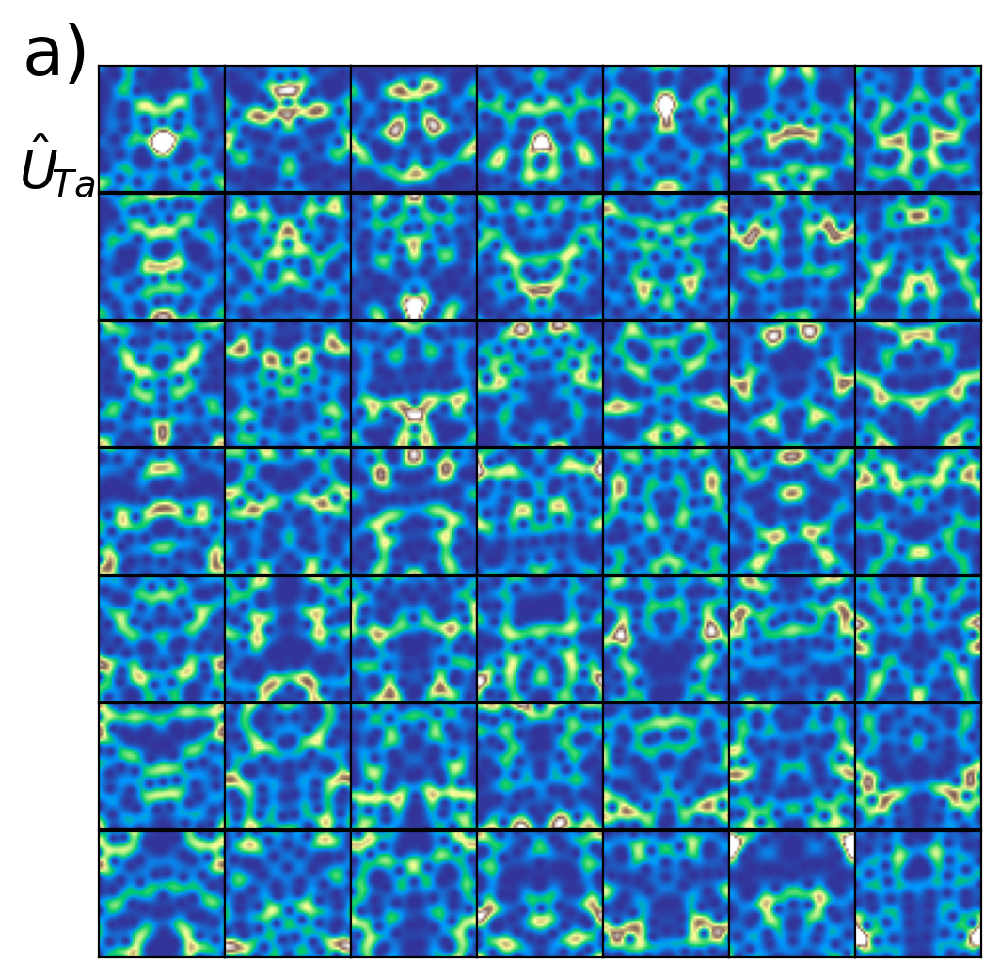

In [57]:
froot=notebookroot + 'Hus_Ta'
pcolorbar=False
#importlib.reload(Husimi)  # if you need to reload it!
Husimi.show_Hus(Hmatrix_Ta,froot,pcolorbar,ablabel='a)',toplabel=r'$\hat U_{\!Ta}$')

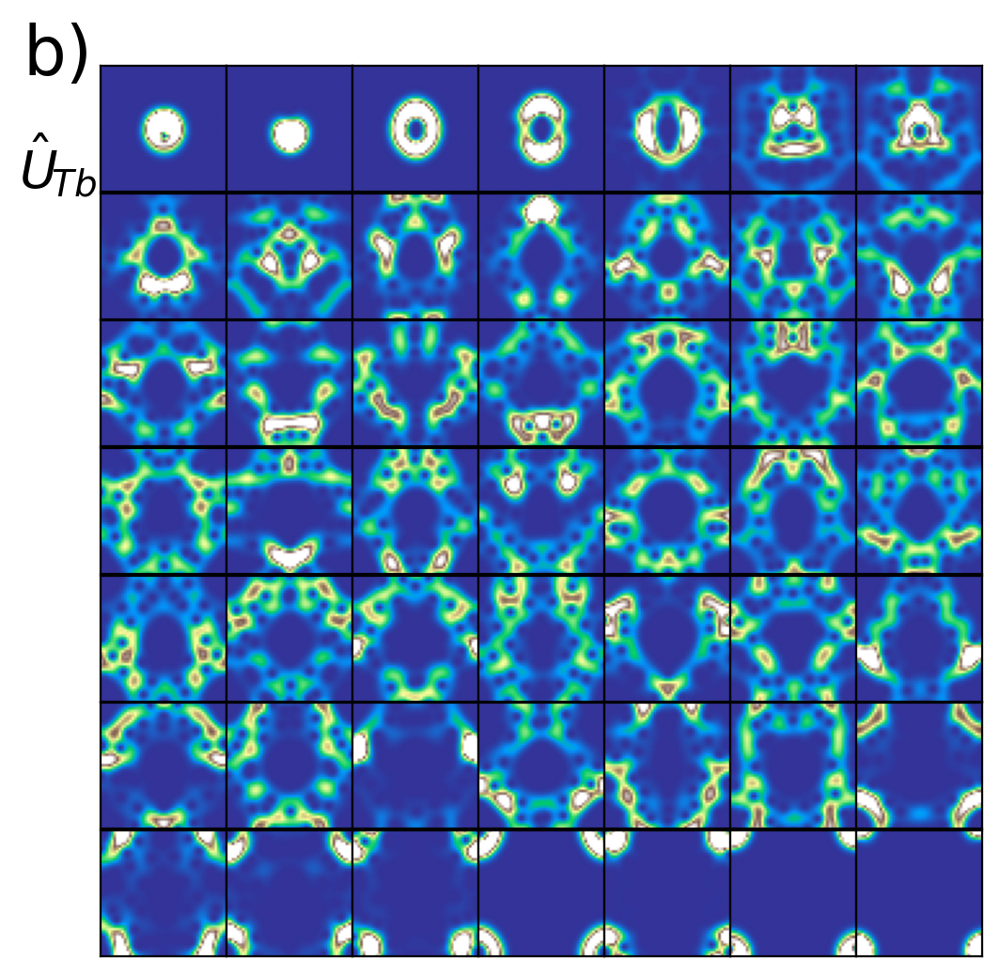

In [56]:
froot=notebookroot + 'Hus_Tb'
pcolorbar=False
Husimi.show_Hus(Hmatrix_Tb,froot,pcolorbar,ablabel='b)',toplabel=r'$\hat U_{\!Tb}$')

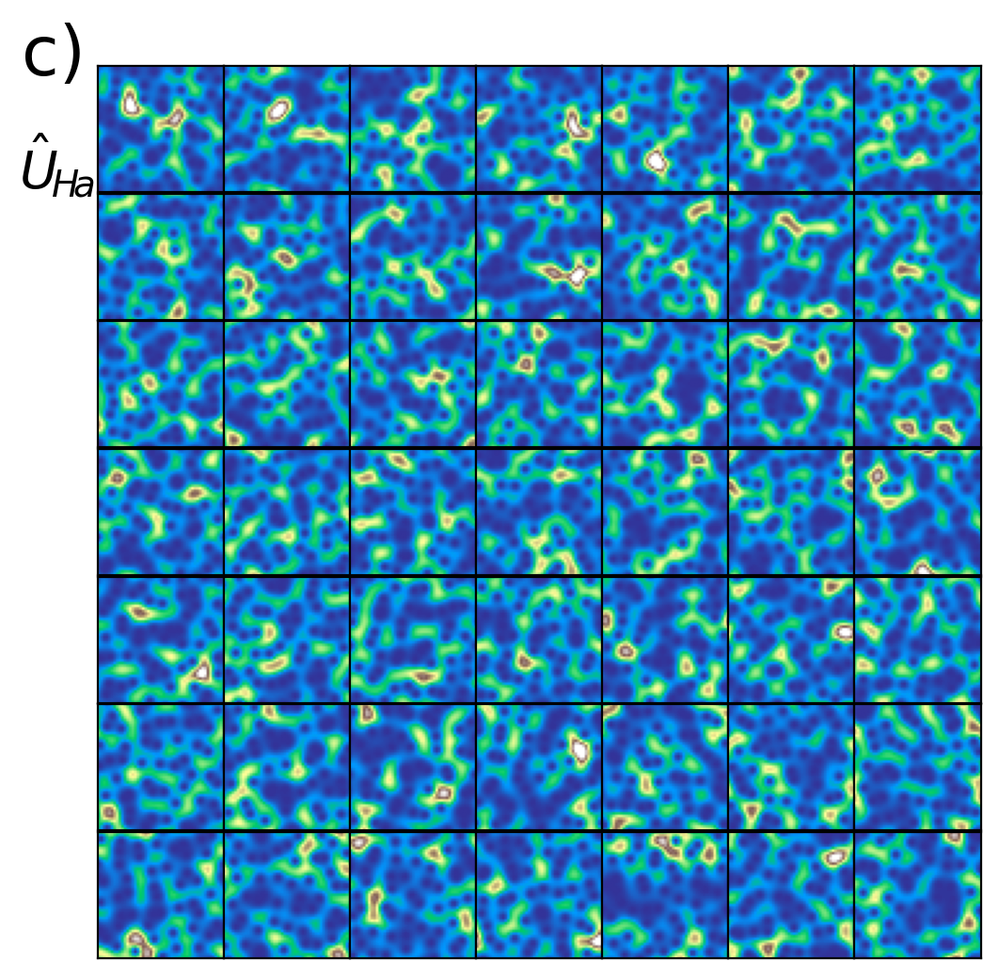

In [60]:
froot=notebookroot + 'Hus_Ha'
pcolorbar=False
Husimi.show_Hus(Hmatrix_Ha,froot,pcolorbar,ablabel='c)',toplabel=r'$\hat U_{\!H\!a}$')

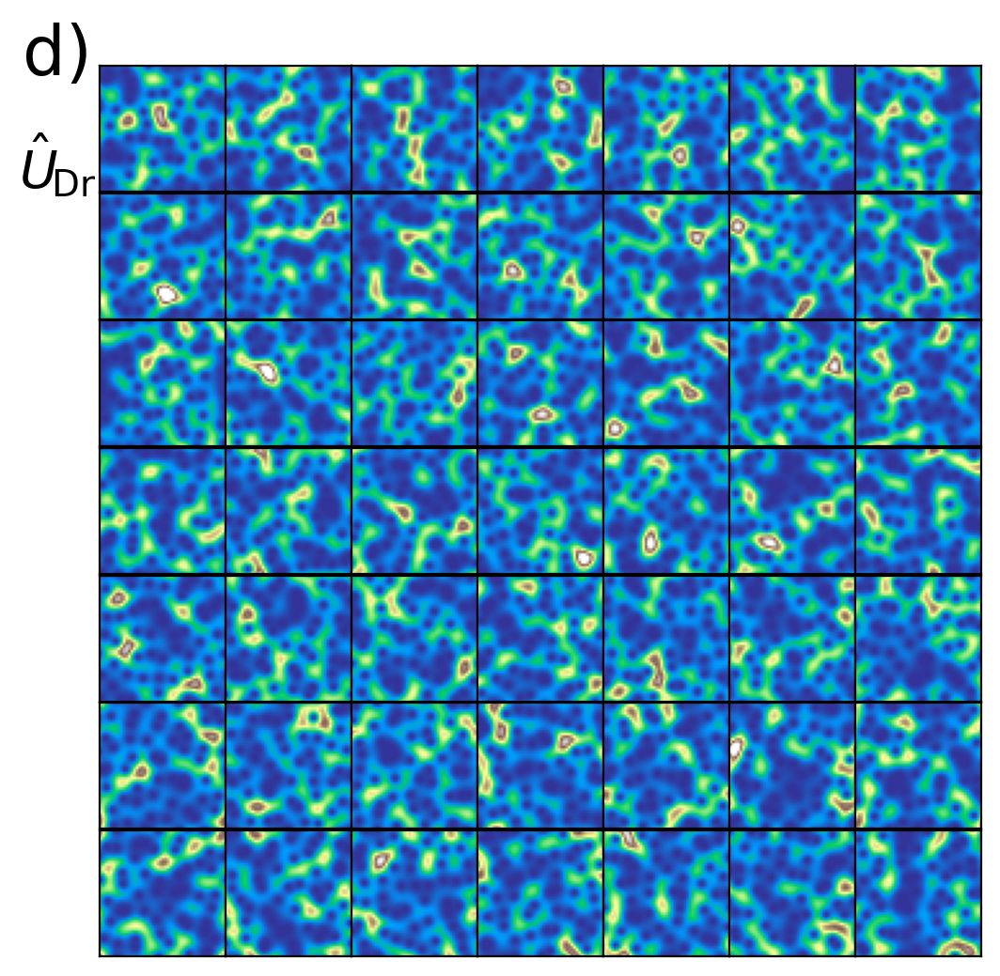

In [59]:
froot=notebookroot + 'Hus_var'
pcolorbar=False
Husimi.show_Hus(Hmatrix_var_1,froot,pcolorbar,ablabel='d)',toplabel=r'$\hat U_{\!\text{Dr}}$')

In [24]:
N=99
cmatrix = Husimi.coh_Dkl_b(N)

In [25]:
ntau = N*4;
a=3.0;   eps=a  
mu=3.441505187577347; mup=3.149830315005767
b=0.01; taushift=0.0
w_s,vr_s,U_final= Husimi.U_prop2(N,ntau,a,b,eps,mu,mup,taushift)
Hmatrix_big = Husimi.stor_Hus(vr_s,cmatrix)

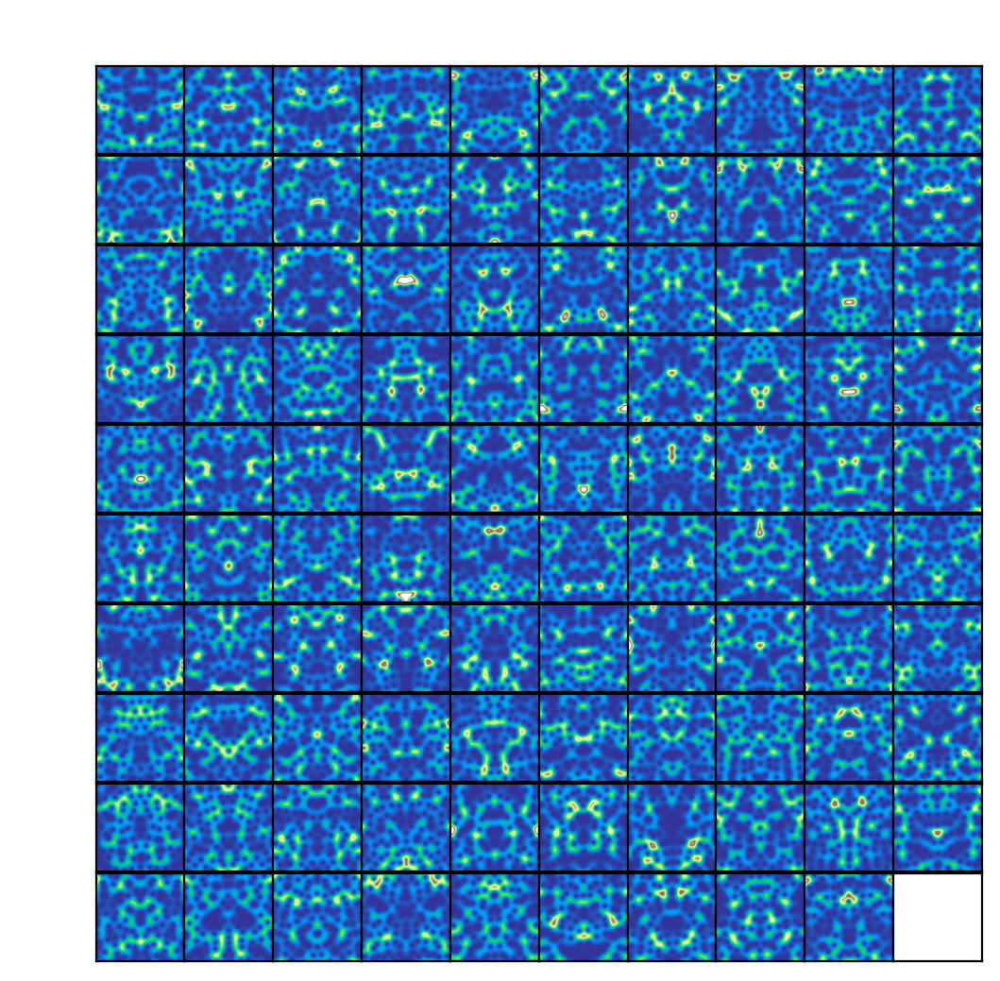

In [30]:
# check the Husimi functions of a totally ergodic system
froot=notebookroot + '_N99'
pcolorbar=False
Husimi.show_Hus(Hmatrix_big,froot,pcolorbar,ablabel='')